# Lab Assignment 2: Networks and Geodemographics

Student number: 200025694
GitHub repo link: [Lab 2 Repo](https://github.com/KatKarasekova/Lab-2-Repo)

## Disclaimer  
In submitting this assignment I hereby confirm that:

I have read the University's statement on Good Academic Practice; that the following work is my own work; and that significant academic debts and borrowings have been properly acknowledged and referenced.
 

## Table of Contents  
1. Introduction
2. Week 5 Challenge 1: GitHub User Network
4. Week 5 Challenge 2: OSMnx
5. Week 6 Challenge: Geodemographic Classification

## Introduction
This Jupyter Notebook contains solutions to weeks' 5 and 6 challenges. All relevant data is included in the GitHub Repo containing this notebook and the code within this notebook already contains the pathways to load the relevant data.

## Week 5 Challenge 1: GitHub User Network

In [1]:
# import data

import pickle

with open('data_week_5/github_users.p', 'rb') as f:
    G = pickle.load(f)
G

In [2]:
# explore length, nodes and edges

print(len(G))# size of the graph 
print(len(G.nodes()))
print(len(G.edges()))
print(type(G.nodes())) # the type of nodes
print(list(G.edges(data=True))[-1]) # Read the attributes associated with the last element of the edges list. 
print(list(G.nodes(data=True))[0]) # Read the attributes associated with the firts element of the node list.
print(type(list(G.edges(data=True))[-1][2])) # Wich type; therefore, you can see what you are reading.

56519
56519
72900
<class 'networkx.classes.reportviews.NodeView'>
('u10898', 'u10901', {})
('u1', {'bipartite': 'users'})
<class 'dict'>


In [4]:
# calculate degree centrality

import networkx as nx

degree_centrality = nx.degree_centrality(G)

In [5]:
# convert degree centrality into a list

dcl = list(degree_centrality.values())
print(type(dcl))

<class 'list'>


(array([5.5187e+04, 7.5500e+02, 2.2600e+02, 1.4400e+02, 2.1000e+01,
        1.5000e+02, 2.6000e+01, 6.0000e+00, 2.0000e+00, 2.0000e+00]),
 array([0.        , 0.00057681, 0.00115361, 0.00173042, 0.00230723,
        0.00288404, 0.00346084, 0.00403765, 0.00461446, 0.00519127,
        0.00576807]),
 <BarContainer object of 10 artists>)

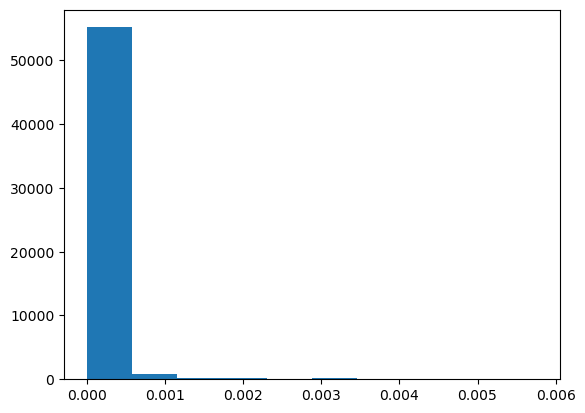

In [7]:
# visualise as a histogram

import matplotlib.pyplot as plt

plt.hist(dcl)

In [8]:
# subset 5 nodes and their edges

list(G.edges())
selected_edges = G.edges(['u1', 'u6', 'u8', 'u16', 'u29'])
Gh_sub = nx.DiGraph()
Gh_sub.add_edges_from(selected_edges)

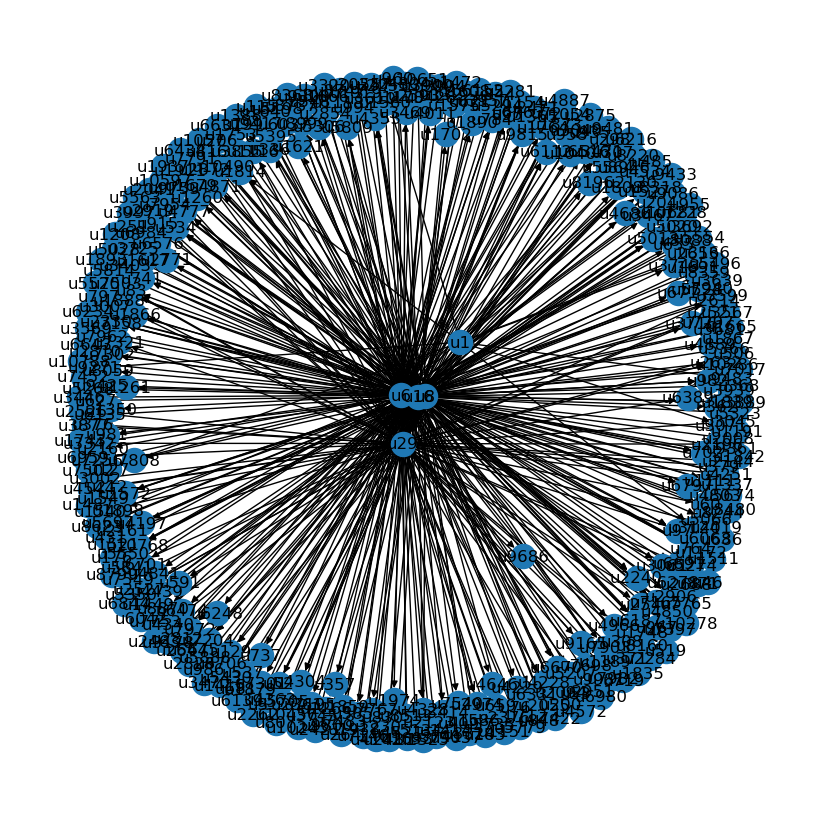

In [9]:
# plot the subset graph

plt.figure(figsize=(8, 8))
nx.draw(Gh_sub, with_labels=True)
plt.show()

(array([5.5187e+04, 7.5500e+02, 2.2600e+02, 1.4400e+02, 2.1000e+01,
        1.5000e+02, 2.6000e+01, 6.0000e+00, 2.0000e+00, 2.0000e+00]),
 array([0.        , 0.00057681, 0.00115361, 0.00173042, 0.00230723,
        0.00288404, 0.00346084, 0.00403765, 0.00461446, 0.00519127,
        0.00576807]),
 <BarContainer object of 10 artists>)

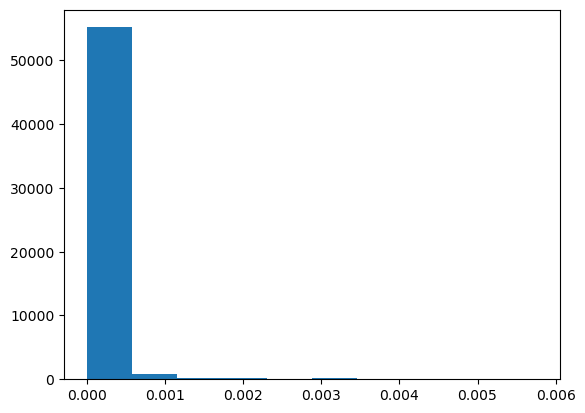

In [10]:
# calculate betweenness centrality of the subset

bc = nx.betweenness_centrality(Gh_sub)
gc_list = list(bc.values())

# visualise as a histogram

plt.hist(dcl)

In [ ]:
# plot Matrix

import nxviz as nv

nv.MatrixPlot(Gh_sub)
plt.show()

In [ ]:
# plot Arc

nv.ArcPlot(Gh_sub)
plt.show()

In [ ]:
# plot Circos

nv.CircosPlot(Gh_sub)
plt.show()

## Week 5 Challenge 2: OSMnx

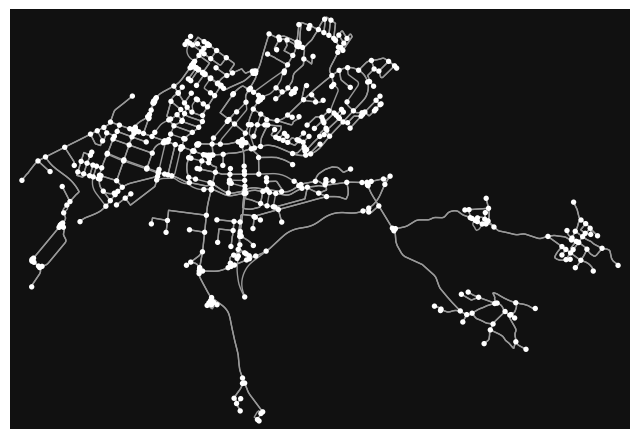

In [14]:
import networkx as nx
import osmnx as ox

# download street network
P = ox.graph_from_place("Prievidza", network_type="drive")
fig, ax = ox.plot_graph(P)

In [16]:
import warnings
warnings.simplefilter('ignore', DeprecationWarning)
warnings.filterwarnings('ignore')

In [17]:
# What sized area does our network cover in square meters?
warnings.filterwarnings('ignore')
P_proj = ox.project_graph(P)
nodes_proj = ox.graph_to_gdfs(P_proj, edges=False)
graph_area_m = nodes_proj.unary_union.convex_hull.area
graph_area_m

25770563.357418805

In [18]:
# basic statistics

ox.basic_stats(P_proj, area=graph_area_m, clean_int_tol=15)

{'n': 612,
 'm': 1420,
 'k_avg': 4.640522875816994,
 'edge_length_total': 195279.476,
 'edge_length_avg': 137.52075774647886,
 'streets_per_node_avg': 2.673202614379085,
 'streets_per_node_counts': {0: 0, 1: 114, 2: 27, 3: 417, 4: 53, 5: 1},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.18627450980392157,
  2: 0.04411764705882353,
  3: 0.6813725490196079,
  4: 0.08660130718954248,
  5: 0.0016339869281045752},
 'intersection_count': 498,
 'street_length_total': 106874.889,
 'street_segment_count': 815,
 'street_length_avg': 131.13483312883434,
 'circuity_avg': 1.0629171303236955,
 'self_loop_proportion': 0.00245398773006135,
 'clean_intersection_count': 370,
 'node_density_km': 23.748025664476522,
 'intersection_density_km': 19.324373825015208,
 'edge_density_km': 7577.6176597933445,
 'street_density_km': 4147.169292255032,
 'clean_intersection_density_km': 14.357466496497244}

In [19]:
# plot the street network by closeness centrality

# convert graph to line graph so edges become nodes and vice versa
edge_centrality = nx.closeness_centrality(nx.line_graph(P))
nx.set_edge_attributes(P, edge_centrality, "edge_centrality")

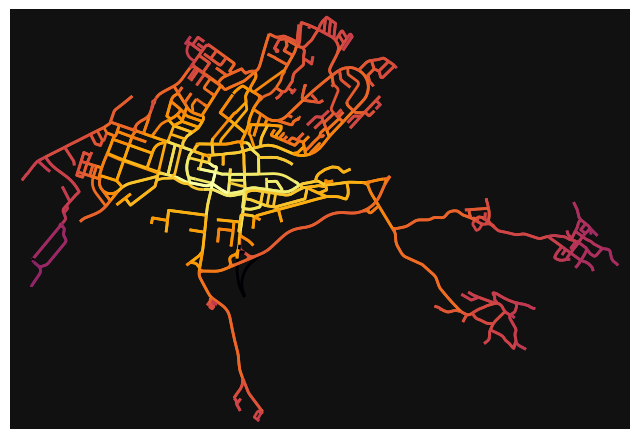

In [20]:
# color edges in original graph with closeness centralities from line graph
ec = ox.plot.get_edge_colors_by_attr(P, "edge_centrality", cmap="inferno")
fig, ax = ox.plot_graph(P, edge_color=ec, edge_linewidth=2, node_size=0)

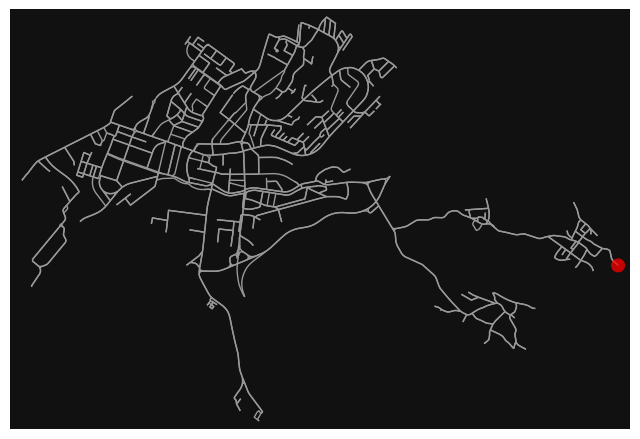

In [21]:
# shortest path btw two points + plot the route

P = ox.speed.add_edge_speeds(P)
P = ox.speed.add_edge_travel_times(P)

# get the nearest network nodes to two lat/lng points with the distance module
orig = ox.distance.nearest_nodes(P, X=48.776356, Y=18.604726)
dest = ox.distance.nearest_nodes(P, X=48.785538, Y=18.619451)

# find the shortest path between nodes, minimizing travel time, then plot it
route = ox.shortest_path(P, orig, dest, weight="travel_time")
fig, ax = ox.plot_graph_route(P, route, node_size=0)

(array([439.,  65.,  59.,  19.,  11.,   7.,   6.,   4.,   1.,   1.]),
 array([0.        , 0.03264063, 0.06528125, 0.09792188, 0.1305625 ,
        0.16320313, 0.19584376, 0.22848438, 0.26112501, 0.29376563,
        0.32640626]),
 <BarContainer object of 10 artists>)

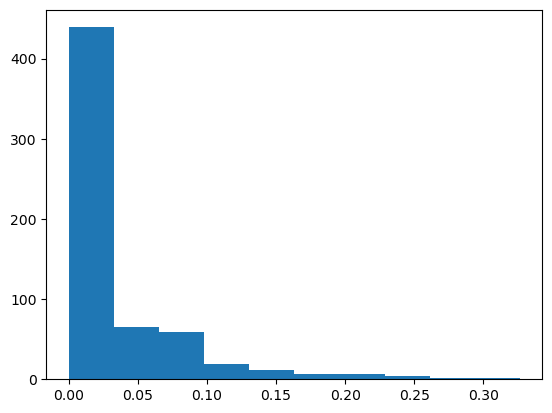

In [23]:
# calculate betweenness centrality

bc = nx.betweenness_centrality(P)
bcl = list(bc.values())

# visualise as a histogram

plt.hist(bcl)

(array([439.,  65.,  59.,  19.,  11.,   7.,   6.,   4.,   1.,   1.]),
 array([0.        , 0.03264063, 0.06528125, 0.09792188, 0.1305625 ,
        0.16320313, 0.19584376, 0.22848438, 0.26112501, 0.29376563,
        0.32640626]),
 <BarContainer object of 10 artists>)

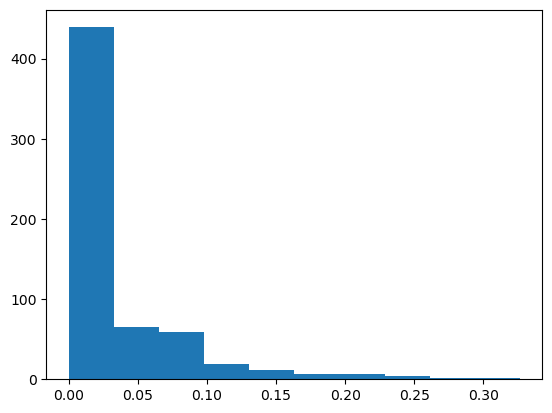

In [24]:
# calculate degree centrality

dc = nx.degree_centrality(P)
dcl = list(bc.values())

# visualise as a histogram

plt.hist(dcl)

In [27]:
# figure-ground

from IPython.display import Image

# configure the inline image display
img_folder = "images"
extension = "png"
size = 240
dpi = 40

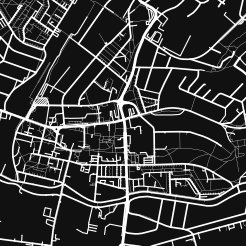

In [28]:
street_widths = {
    "footway": 0.5,
    "steps": 0.5,
    "pedestrian": 0.5,
    "path": 0.5,
    "track": 0.5,
    "service": 2,
    "residential": 3,
    "primary": 5,
    "motorway": 6,
}
place = "Prievidza"
point = (48.773236, 18.624948)
fp = f"./{img_folder}/{place}.{extension}"
fig, ax = ox.plot_figure_ground(
    point=point,
    filepath=fp,
    network_type="all",
    street_widths=street_widths,
    dpi=dpi,
    save=True,
    show=False,
    close=True,
)
Image(fp, height=size, width=size)

In [29]:
# export to gpkg
ox.save_graph_geopackage(P, filepath="./data/prievidzanetwork.gpkg")

In [ ]:
# interactive map - nodes

nodes = ox.graph_to_gdfs(P, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 8})

### Map screenshot:
![Map](map1.png)

In [ ]:
# interactive map - edges

ox.graph_to_gdfs(P, nodes=False).explore()

### Map screenshot:
![Map](map2.png)

In [ ]:
# interactive map - nodes + edges

nodes, edges = ox.graph_to_gdfs(P)
m = edges.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes.explore(m=m, color="pink", marker_kwds={"radius": 6})

### Map screenshot:
![Map](map3.png)

In [ ]:
# interactive map - nodes by betweenness centrality

nx.set_node_attributes(P, nx.betweenness_centrality(P, weight="length"), name="bc")
nodes = ox.graph_to_gdfs(P, edges=False)
nodes.explore(tiles="cartodbdarkmatter", column="bc", marker_kwds={"radius": 8})

### Map screenshot:
![Map](map4.png)

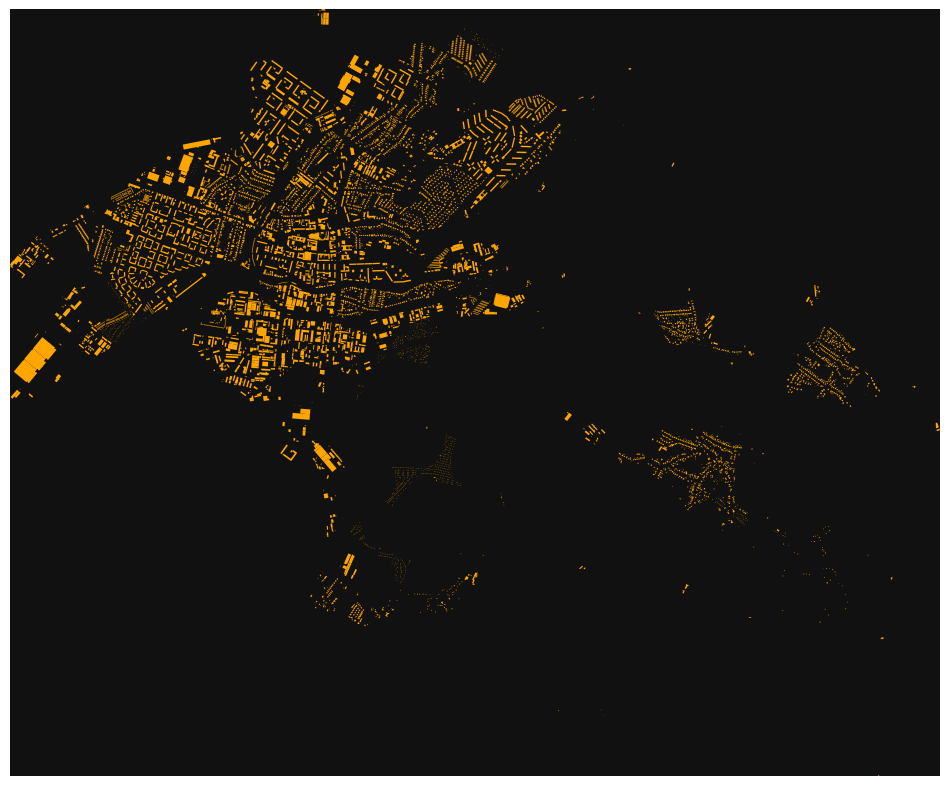

In [34]:
# extract and plot other elements (parks)
# get all building footprints in some neighborhood
place = "Prievidza, Slovakia"
tags = {"building": True}
gdf = ox.features_from_place(place, tags)
gdf.shape

warnings.simplefilter('ignore', DeprecationWarning)

fig, ax = ox.plot_footprints(gdf, figsize=(12, 10))

# Week 6 Challenge: Geodemographic Classification

In this challenge, you will replicate the process of creating a geodemographic classification using the k-means clustering algorithm. Please select any city in the UK except London, Liverpool, or Glasgow. The main goal is to generate a meaningful and informative classification that captures the diversity of areas in your dataset using the census data ( For England, you can try to use the 2021 or 2011 census, and for Scotland, you need to use the 2011 census data) 

1. Define the main goal for the geodemographic classification (marketing, retail and service planning). 
2. Look for census data from the selected city for which you would like to generate the geodemographic classification.
3. The census data at the Output Area OA level. Select multiple topics of at least four topics (socio-demographics, economics, health, and so on). Describe your topic selection accordingly based on the goal of your geodemographic classification. For example, if your geodemographics are related to marketing, Economic variables might be the appropriate selection. 
4. Identify the variables that will be crucial for effectively segmenting neighbourhoods. Evaluate how this choice may impact the classification results, including a DEA analysis.
5. Prepare, adjust or clean the dataset addressing any missing values or outliers that could distort the clustering results.
6. Include standardisation between areas and variables. Make an appropriate analysis and adjust the variable selection accordingly for any multicollinearity.
7. Utilize the k-means clustering algorithm to create a classification based on the selected variables.
8. Define the optimum number of clusters (i.e., using the Elblow method). Experiment with different values of k.
9. Evaluate your cluster groups (e.g., using PCA) and interpret your cluster centres. Describe your results and repeat the process to adjust the variable selection and cluster groups to provide more meaningful results for your geodemographic goal. Interpret the characteristics of each cluster. What demographic patterns or similarities are prevalent within each group?
10. Map the final cluster groups
11. Finish the analysis by naming the final clusters and plotting a final map that includes the census values and the provided names.
12. Finally, acknowledge the subjective nature of classification and make analytical decisions to produce an optimum classification for your specific purpose. Reflect on the challenges and insights gained during the classification process. Ensure you document your analytical decisions and the rationale behind any important decision. Once your geodemographics are constructed, describe the potential use cases for the geodemographic classification you have built based on your initial goal.

## Aim and data description

In this hypothetical scenario, I will be analysing the neighbourhood composition in Dundee for the purposes of service planning. The city council would like to understand the age composition of neighbourhoods and assess their vulnerability based on family structure, health and employment status. The analysis results could be used to direct resources towards supporting neighbourhoods with relevant challenges they face.  
The data used in this analysis is the 2011 Census Data, analysed and the Output Area level. [Output Areas](https://www.spatialdata.gov.scot/geonetwork/srv/eng/catalog.search#/metadata/e8544752-8d8e-4be4-8fad-68e7e70a90b8) were downloaded from the SpatialData.gov.scot website and the shapefile for Dundee City Council Output Areas was created from this dataset by querying its database in QGIS.

The following data from the 2011 Scottish Census were downloaded and merged into a single csv file which will be used in this analysis.

**Subset of Scottish Census for Output Areas - OA geographies 2011**

* KS102SC - Age structure - Demographics
* KS103SC - Marital and civil partnership status - Demographics
* KS209SCb - Religion - Demographics
* QS104SC - Sex - Demographics
* QS501SC - Highest level of qualification - Education
* QS415SC - Central heating - Households 
* KS105SC - Household composition - Households
* QS302SC - General Health - Health
* KS601SC - Economic activity - Economic 
* KS605SC - Industry - Economic 


In [1]:
import pandas as pd
import geopandas as gpd

shp_path = "data_week_6/Dundee_OAs.shp"
gdf = gpd.read_file(shp_path)

csv_path = "data_week_6/merged_census_data.csv"
csv_data = pd.read_csv(csv_path, low_memory=False)

# Merge the GeoDataFrame with the DataFrame based on the oa_code
merged_data = gdf.merge(csv_data, left_on='code', right_on='oa_code', how='left')

In [2]:
merged_data.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,Solid fuel (for example wood coal) central heating,Other central heating,Two or more types of central heating,oa_code.9,All people aged 16 and over.1,All people aged 16 and over: No qualifications,All people aged 16 and over: Level 1,All people aged 16 and over: Level 2,All people aged 16 and over: Level 3,All people aged 16 and over: Level 4 and above
0,6451,S00099543,65,117,S12000042,0.026562,2.656221,DD1 2EA,340440,730521,...,0,0,3,S00099543,115,8,13,33,16,45
1,6452,S00099548,50,115,S12000042,0.012002,1.200230,DD1 2ND,340674,731017,...,0,0,2,S00099548,102,20,21,20,12,29
2,6453,S00099111,58,156,S12000042,0.019184,1.918406,DD4 8XG,342169,732305,...,0,0,2,S00099111,118,19,41,22,9,27
3,6454,S00099269,81,139,S12000042,0.026515,2.651547,DD4 0TQ,344648,733747,...,0,0,0,S00099269,134,23,37,21,22,31
4,6455,S00099374,64,139,S12000042,0.037729,3.772863,DD5 3JA,346817,731693,...,0,0,0,S00099374,127,11,35,21,15,45


## DEA Analysis

C:\Users\42191\miniforge3\envs\ua\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\42191\miniforge3\envs\ua\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\42191\miniforge3\envs\ua\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\42191\miniforge3\envs\ua\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



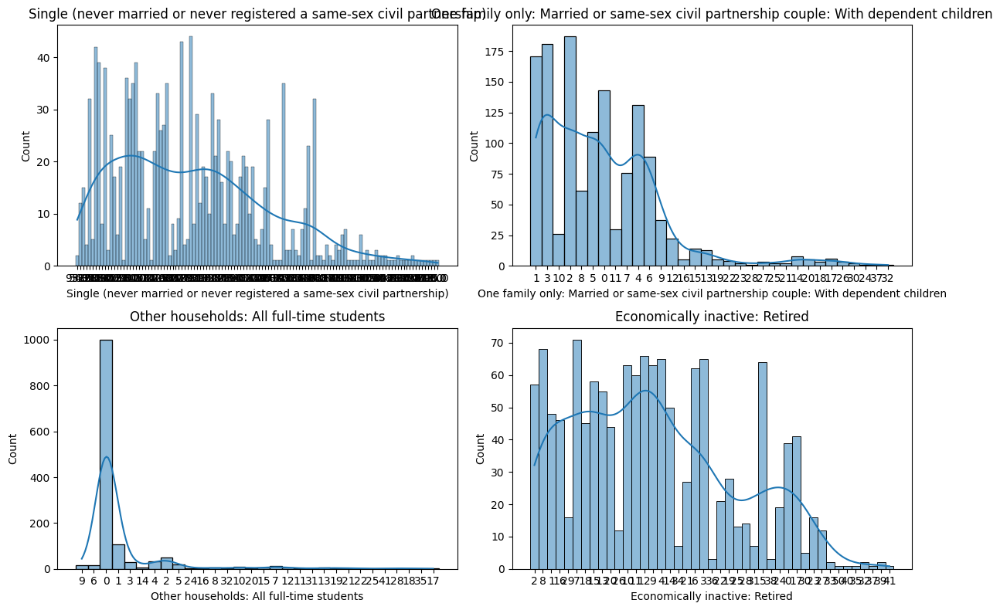

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

attributes_to_plot = ['Single (never married or never registered a same-sex civil partnership)',
                      'One family only: Married or same-sex civil partnership couple: With dependent children',
                      'Other households: All full-time students',
                      'Economically inactive: Retired']

plt.figure(figsize=(12, 8))

for i, attribute in enumerate(attributes_to_plot, 1):
    plt.subplot(2, 2, i)
    sns.histplot(merged_data[attribute].astype(str), kde=True)
    plt.title(attribute)

plt.tight_layout()
plt.show()

By plotting histograms for a selection of variables we can evaluate whether there are any outliers or unusually distributed values that could skew the analysis. In the above case, none of the values exhibit unexpected distributions, so the data is suitable for further analysis.

## Subsetting Data

The following 20 variables were chosen:

1. Age variables: number of minors, young adults, adults and elderly
2. Household composition: single, married, divorced, families with dependent children, lone parent with dependent children, all student households
3. Sex: male or female
4. Economic activity: full-time employed, part-time employed, unemployed, long-term sick or disabled, looking after family, retired
5. Health: good health, bad health

In [2]:
# calculate new columns for age groups minors (0,17), young adults (18-29), adults (30-59), elderly (over 60)

# replace - with 0
merged_data = merged_data.replace('-', 0)

# convert to integer

merged_data['0 to 4'] = merged_data['0 to 4'].astype(int)
merged_data['5 to 7'] = merged_data['5 to 7'].astype(int)
merged_data['8 to 9'] = merged_data['8 to 9'].astype(int)
merged_data['10 to 14'] = merged_data['10 to 14'].astype(int)
merged_data['15'] = merged_data['15'].astype(int)
merged_data['16 to 17'] = merged_data['16 to 17'].astype(int)
merged_data['18 to 19'] = merged_data['18 to 19'].astype(int)
merged_data['20 to 24'] = merged_data['20 to 24'].astype(int)
merged_data['25 to 29'] = merged_data['25 to 29'].astype(int)
merged_data['30 to 44'] = merged_data['30 to 44'].astype(int)
merged_data['45 to 59'] = merged_data['45 to 59'].astype(int)
merged_data['60 to 64'] = merged_data['60 to 64'].astype(int)
merged_data['65 to 74'] = merged_data['65 to 74'].astype(int)
merged_data['75 to 84'] = merged_data['75 to 84'].astype(int)
merged_data['85 to 89'] = merged_data['85 to 89'].astype(int)
merged_data['90 and over'] = merged_data['90 and over'].astype(int)

In [3]:
# calculate a new column for children under 18
merged_data['minors'] = merged_data['0 to 4'] + merged_data['5 to 7'] + merged_data['8 to 9'] + merged_data['10 to 14'] + merged_data['15'] + merged_data['16 to 17']

# young adults
merged_data['y_adults'] = merged_data['18 to 19'] + merged_data['20 to 24'] + merged_data['25 to 29']

# adults
merged_data['adults'] = merged_data['30 to 44'] + merged_data['45 to 59']

# senior citizens
merged_data['elderly'] = merged_data['60 to 64'] + merged_data['65 to 74'] + merged_data['75 to 84'] + merged_data['85 to 89'] + merged_data['90 and over']

merged_data.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,All people aged 16 and over.1,All people aged 16 and over: No qualifications,All people aged 16 and over: Level 1,All people aged 16 and over: Level 2,All people aged 16 and over: Level 3,All people aged 16 and over: Level 4 and above,minors,y_adults,adults,elderly
0,6451,S00099543,65,117,S12000042,0.026562,2.656221,DD1 2EA,340440,730521,...,115,8,13,33,16,45,2,76,37,2
1,6452,S00099548,50,115,S12000042,0.012002,1.200230,DD1 2ND,340674,731017,...,102,20,21,20,12,29,16,44,40,15
2,6453,S00099111,58,156,S12000042,0.019184,1.918406,DD4 8XG,342169,732305,...,118,19,41,22,9,27,41,28,79,8
3,6454,S00099269,81,139,S12000042,0.026515,2.651547,DD4 0TQ,344648,733747,...,134,23,37,21,22,31,9,26,81,23
4,6455,S00099374,64,139,S12000042,0.037729,3.772863,DD5 3JA,346817,731693,...,127,11,35,21,15,45,20,16,47,56


In [4]:
# calculate percentages out of total values for selected variables

def calculate_percentages(dataframe, total_columns, value_columns):

    result_df = pd.DataFrame()

    for total_col, value_col in zip(total_columns, value_columns):
        percentage_col_name = f"{value_col}_percentage"

        if total_col not in dataframe.columns:
            raise ValueError(f"Total column '{total_col}' not found in the DataFrame.")
        # The data have several empty values, so you need to process them, forcing them to be a numeric or NaN value
        dataframe[value_col] = pd.to_numeric(dataframe[value_col], errors='coerce')
        dataframe[total_col] = pd.to_numeric(dataframe[total_col], errors='coerce')
        
        result_df[percentage_col_name] = (dataframe[value_col] / dataframe[total_col]) * 100

    return result_df

# List of the corresponding totals.
total_cols = ['All people',
              'All people',
              'All people',
              'All people',
              'All people aged 16 and over.1',
              'All people aged 16 and over.1',
              'All people aged 16 and over.1', 
              'All households',
              'All households',
              'All households',
              'All people',
              'All people', 
              'All people aged 16 to 74 in employment', 
              'All people aged 16 to 74',
              'All people aged 16 to 74 in employment', 
              'All people',
              'All people',
              'All people aged 16 to 74',
              'All people aged 16 to 74',
              'All people aged 16 to 74' ]

# List of the corresponding values. 
value_cols = ['minors',
              'y_adults',
              'adults',
              'elderly',
              'Single (never married or never registered a same-sex civil partnership)',
              'Married',
              'Divorced or formerly in a same-sex civil partnership which is now legally dissolved',
              'One family only: Married or same-sex civil partnership couple: With dependent children',
              'One family only: Lone parent: With dependent children',
              'Other households: All full-time students',
              'Males',
              'Females',
              'Economically active: Employee: Full-time',
              'Economically active: Unemployed', 
              'Economically active: Employee: Part-time',
              'Good health',
              'Bad health',
              'Economically inactive: Looking after home or family', 
              'Economically inactive: Long-term sick or disabled',
              'Economically inactive: Retired']

result_dataframe = calculate_percentages(merged_data, total_cols, value_cols)

In [7]:
result_dataframe.head()

,minors_percentage,y_adults_percentage,adults_percentage,elderly_percentage,Single (never married or never registered a same-sex civil partnership)_percentage,Married_percentage,Divorced or formerly in a same-sex civil partnership which is now legally dissolved_percentage,One family only: Married or same-sex civil partnership couple: With dependent children_percentage,One family only: Lone parent: With dependent children_percentage,Other households: All full-time students_percentage,Males_percentage,Females_percentage,Economically active: Employee: Full-time_percentage,Economically active: Unemployed_percentage,Economically active: Employee: Part-time_percentage,Good health_percentage,Bad health_percentage,Economically inactive: Looking after home or family_percentage,Economically inactive: Long-term sick or disabled_percentage,Economically inactive: Retired_percentage
0,1.709402,64.957265,31.623932,1.709402,80.869565,13.913043,4.347826,1.538462,1.538462,13.846154,56.410256,43.589744,47.619048,4.385965,17.460317,35.042735,1.709402,1.754386,3.508772,1.754386
1,13.913043,38.260870,34.782609,13.043478,52.941176,27.450980,8.823529,6.000000,6.000000,12.000000,51.304348,48.695652,41.071429,6.122449,23.214286,41.739130,0.869565,1.020408,4.081633,8.163265
2,26.282051,17.948718,50.641026,5.128205,43.220339,38.983051,12.711864,17.241379,8.620690,0.000000,48.717949,51.282051,75.000000,3.448276,16.000000,20.512821,0.641026,2.586207,2.586207,0.862069
3,6.474820,18.705036,58.273381,16.546763,47.014925,32.835821,11.940299,2.469136,2.469136,0.000000,52.517986,47.482014,79.166667,2.290076,12.500000,28.776978,2.158273,0.763359,6.106870,12.213740
4,14.388489,11.510791,33.812950,40.287770,25.984252,54.330709,7.086614,12.500000,6.250000,1.562500,46.043165,53.956835,73.770492,4.716981,21.311475,33.812950,2.158273,0.000000,0.000000,27.358491


In [5]:
# Concatenate the resulting tables.
concatenated_df = pd.concat([merged_data, result_dataframe], axis=1, ignore_index=False)
concatenated_df.head()

,OBJECTID,code,HHcount,Popcount,council,sqkm,hect,masterpc,easting,northing,...,Males_percentage,Females_percentage,Economically active: Employee: Full-time_percentage,Economically active: Unemployed_percentage,Economically active: Employee: Part-time_percentage,Good health_percentage,Bad health_percentage,Economically inactive: Looking after home or family_percentage,Economically inactive: Long-term sick or disabled_percentage,Economically inactive: Retired_percentage
0,6451,S00099543,65,117,S12000042,0.026562,2.656221,DD1 2EA,340440,730521,...,56.410256,43.589744,47.619048,4.385965,17.460317,35.042735,1.709402,1.754386,3.508772,1.754386
1,6452,S00099548,50,115,S12000042,0.012002,1.200230,DD1 2ND,340674,731017,...,51.304348,48.695652,41.071429,6.122449,23.214286,41.739130,0.869565,1.020408,4.081633,8.163265
2,6453,S00099111,58,156,S12000042,0.019184,1.918406,DD4 8XG,342169,732305,...,48.717949,51.282051,75.000000,3.448276,16.000000,20.512821,0.641026,2.586207,2.586207,0.862069
3,6454,S00099269,81,139,S12000042,0.026515,2.651547,DD4 0TQ,344648,733747,...,52.517986,47.482014,79.166667,2.290076,12.500000,28.776978,2.158273,0.763359,6.106870,12.213740
4,6455,S00099374,64,139,S12000042,0.037729,3.772863,DD5 3JA,346817,731693,...,46.043165,53.956835,73.770492,4.716981,21.311475,33.812950,2.158273,0.000000,0.000000,27.358491


In [10]:
list(concatenated_df.columns)

['OBJECTID',
 'code',
 'HHcount',
 'Popcount',
 'council',
 'sqkm',
 'hect',
 'masterpc',
 'easting',
 'northing',
 'SHAPE_1_Le',
 'SHAPE_1_Ar',
 'DataZone',
 'geometry',
 'oa_code',
 'All people',
 '0 to 4',
 '5 to 7',
 '8 to 9',
 '10 to 14',
 '15',
 '16 to 17',
 '18 to 19',
 '20 to 24',
 '25 to 29',
 '30 to 44',
 '45 to 59',
 '60 to 64',
 '65 to 74',
 '75 to 84',
 '85 to 89',
 '90 and over',
 'Mean age',
 'Median age',
 'oa_code.1',
 'All people aged 16 and over',
 'Single (never married or never registered a same-sex civil partnership)',
 'Married',
 'In a registered same-sex civil partnership',
 'Separated (but still legally married or still legally in a same-sex civil partnership)',
 'Divorced or formerly in a same-sex civil partnership which is now legally dissolved',
 'Widowed or surviving partner from a same-sex civil partnership',
 'oa_code.2',
 'All households',
 'One person household: Aged 65 and over',
 'One person household: Aged under 65',
 'One family only: All aged 65 a

In [6]:
# subset only percentage attributes

keep_cols= [
    'code',
    'Popcount',
    'HHcount',
    'DataZone',
    'geometry',
    'minors_percentage',
    'y_adults_percentage',
    'adults_percentage',
    'elderly_percentage',
    'Single (never married or never registered a same-sex civil partnership)_percentage',
    'Married_percentage',
    'Divorced or formerly in a same-sex civil partnership which is now legally dissolved_percentage',
    'One family only: Married or same-sex civil partnership couple: With dependent children_percentage',
    'One family only: Lone parent: With dependent children_percentage',
    'Other households: All full-time students_percentage',
    'Males_percentage',
    'Females_percentage',
    'Economically active: Employee: Full-time_percentage',
    'Economically active: Unemployed_percentage',
    'Economically active: Employee: Part-time_percentage',
    'Good health_percentage',
    'Bad health_percentage',
    'Economically inactive: Looking after home or family_percentage',
    'Economically inactive: Long-term sick or disabled_percentage',
    'Economically inactive: Retired_percentage'
]

dundee_census_data = concatenated_df[keep_cols]

In [10]:
dundee_census_data.head()

,code,Popcount,HHcount,DataZone,geometry,minors_percentage,y_adults_percentage,adults_percentage,elderly_percentage,Single (never married or never registered a same-sex civil partnership)_percentage,...,Males_percentage,Females_percentage,Economically active: Employee: Full-time_percentage,Economically active: Unemployed_percentage,Economically active: Employee: Part-time_percentage,Good health_percentage,Bad health_percentage,Economically inactive: Looking after home or family_percentage,Economically inactive: Long-term sick or disabled_percentage,Economically inactive: Retired_percentage
0,S00099543,117,65,S01007711,"POLYGON ((340487.292 730518.631, 340482.034 73...",1.709402,64.957265,31.623932,1.709402,80.869565,...,56.410256,43.589744,47.619048,4.385965,17.460317,35.042735,1.709402,1.754386,3.508772,1.754386
1,S00099548,115,50,S01007713,"POLYGON ((340646.802 731081.561, 340649.389 73...",13.913043,38.260870,34.782609,13.043478,52.941176,...,51.304348,48.695652,41.071429,6.122449,23.214286,41.739130,0.869565,1.020408,4.081633,8.163265
2,S00099111,156,58,S01007802,"POLYGON ((342264.449 732286.711, 342256.623 73...",26.282051,17.948718,50.641026,5.128205,43.220339,...,48.717949,51.282051,75.000000,3.448276,16.000000,20.512821,0.641026,2.586207,2.586207,0.862069
3,S00099269,139,81,S01007780,"POLYGON ((344784.000 733788.000, 344794.683 73...",6.474820,18.705036,58.273381,16.546763,47.014925,...,52.517986,47.482014,79.166667,2.290076,12.500000,28.776978,2.158273,0.763359,6.106870,12.213740
4,S00099374,139,64,S01007766,"POLYGON ((346960.001 731725.000, 346797.000 73...",14.388489,11.510791,33.812950,40.287770,25.984252,...,46.043165,53.956835,73.770492,4.716981,21.311475,33.812950,2.158273,0.000000,0.000000,27.358491


In [7]:
# define short column names
short_column_names = {
    'minors_percentage' : 'minors',
    'y_adults_percentage' : 'y_adults',
    'adults_percentage' : 'adults',
    'elderly_percentage' : 'elderly',
    'Single (never married or never registered a same-sex civil partnership)_percentage' : 'single',
    'Married_percentage' : 'married',
    'Divorced or formerly in a same-sex civil partnership which is now legally dissolved_percentage' : 'divorced',
    'One family only: Married or same-sex civil partnership couple: With dependent children_percentage' : 'fam_with_children',
    'One family only: Lone parent: With dependent children_percentage' : 'single_parent',
    'Other households: All full-time students_percentage' : 'students',
    'Males_percentage' : 'males',
    'Females_percentage' : 'females',
    'Economically active: Employee: Full-time_percentage' : 'emp_full-time',
    'Economically active: Unemployed_percentage' : 'unemp',
    'Economically active: Employee: Part-time_percentage': 'emp_part-time',
    'Good health_percentage' : 'good_health',
    'Bad health_percentage' : 'bad_health',
    'Economically inactive: Looking after home or family_percentage' : 'at_home',
    'Economically inactive: Long-term sick or disabled_percentage' : 'sick_or_disab',
    'Economically inactive: Retired_percentage' : 'retired'
}

dundee_census_data = dundee_census_data.rename(columns=short_column_names)

In [12]:
dundee_census_data.head()

,code,Popcount,HHcount,DataZone,geometry,minors,y_adults,adults,elderly,single,...,males,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab,retired
0,S00099543,117,65,S01007711,"POLYGON ((340487.292 730518.631, 340482.034 73...",1.709402,64.957265,31.623932,1.709402,80.869565,...,56.410256,43.589744,47.619048,4.385965,17.460317,35.042735,1.709402,1.754386,3.508772,1.754386
1,S00099548,115,50,S01007713,"POLYGON ((340646.802 731081.561, 340649.389 73...",13.913043,38.260870,34.782609,13.043478,52.941176,...,51.304348,48.695652,41.071429,6.122449,23.214286,41.739130,0.869565,1.020408,4.081633,8.163265
2,S00099111,156,58,S01007802,"POLYGON ((342264.449 732286.711, 342256.623 73...",26.282051,17.948718,50.641026,5.128205,43.220339,...,48.717949,51.282051,75.000000,3.448276,16.000000,20.512821,0.641026,2.586207,2.586207,0.862069
3,S00099269,139,81,S01007780,"POLYGON ((344784.000 733788.000, 344794.683 73...",6.474820,18.705036,58.273381,16.546763,47.014925,...,52.517986,47.482014,79.166667,2.290076,12.500000,28.776978,2.158273,0.763359,6.106870,12.213740
4,S00099374,139,64,S01007766,"POLYGON ((346960.001 731725.000, 346797.000 73...",14.388489,11.510791,33.812950,40.287770,25.984252,...,46.043165,53.956835,73.770492,4.716981,21.311475,33.812950,2.158273,0.000000,0.000000,27.358491


In [13]:
dundee_census_data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1344 entries, 0 to 1343
Data columns (total 25 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   code               1344 non-null   object  
 1   Popcount           1344 non-null   int64   
 2   HHcount            1344 non-null   int64   
 3   DataZone           1344 non-null   object  
 4   geometry           1344 non-null   geometry
 5   minors             1343 non-null   float64 
 6   y_adults           1343 non-null   float64 
 7   adults             1343 non-null   float64 
 8   elderly            1343 non-null   float64 
 9   single             1343 non-null   float64 
 10  married            1343 non-null   float64 
 11  divorced           1343 non-null   float64 
 12  fam_with_children  1344 non-null   float64 
 13  single_parent      1344 non-null   float64 
 14  students           1344 non-null   float64 
 15  males              1343 non-null   float64 
 16

## Standardisation

In [8]:
# calculate z-scores for numeric columns

numeric_columns = dundee_census_data.select_dtypes(include='float64')
z_score_df = (numeric_columns - numeric_columns.mean()) / numeric_columns.std(ddof=0)
z_score_df.head()

,minors,y_adults,adults,elderly,single,married,divorced,fam_with_children,single_parent,students,males,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab,retired
0,-1.661323,2.681794,-0.574091,-1.326503,2.124519,-1.258280,-1.040626,-0.889656,-0.883783,1.513136,1.438049,-1.438049,-1.214245,-0.338907,-0.555548,0.695033,-0.843743,-0.478198,-0.520501,-1.180636
1,-0.365038,1.047569,-0.244033,-0.663451,0.604768,-0.486989,-0.223321,-0.387687,-0.351030,1.264302,0.561098,-0.561098,-1.803806,0.025838,0.058968,1.735736,-1.059249,-0.709255,-0.421431,-0.654936
2,0.948813,-0.195843,1.413050,-1.126500,0.075799,0.170023,0.486726,0.877086,-0.038094,-0.353119,0.116879,-0.116879,1.251192,-0.535867,-0.711508,-1.563096,-1.117893,-0.216340,-0.680047,-1.253830
3,-1.155134,-0.149545,2.210573,-0.458506,0.282285,-0.180201,0.345831,-0.784946,-0.772651,-0.353119,0.769543,-0.769543,1.626367,-0.779145,-1.085303,-0.278744,-0.728560,-0.790175,-0.071191,-0.322688
4,-0.314535,-0.589942,-0.345355,0.930360,-0.862120,1.044419,-0.540498,0.343631,-0.321178,-0.142517,-0.342521,0.342521,1.140484,-0.269378,-0.144250,0.503909,-0.728560,-1.030481,-1.127300,0.919590


## Correlation

In [9]:
# calculate correlation between pairs of variables

corr = z_score_df.corr()
corr.style.background_gradient(cmap='coolwarm')

,minors,y_adults,adults,elderly,single,married,divorced,fam_with_children,single_parent,students,males,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab,retired
minors,1.000000,-0.320216,0.350031,-0.440695,-0.093651,0.211529,-0.019652,0.501756,0.721348,-0.335720,-0.058057,0.058057,-0.073748,0.295177,0.451880,-0.226682,-0.214911,0.566985,0.065165,-0.337056
y_adults,-0.320216,1.000000,-0.382054,-0.565405,0.867174,-0.627806,-0.225058,-0.306866,-0.093266,0.808135,0.271613,-0.271613,-0.326143,0.050882,-0.331355,-0.029181,-0.253086,-0.109024,-0.103416,-0.572449
adults,0.350031,-0.382054,1.000000,-0.387522,-0.190944,0.305621,0.109954,0.410679,0.077601,-0.467311,0.218393,-0.218393,0.294637,0.121214,0.114166,-0.080007,-0.185211,0.046867,0.075419,-0.358627
elderly,-0.440695,-0.565405,-0.387522,1.000000,-0.670242,0.312365,0.164343,-0.213002,-0.351594,-0.325777,-0.349863,0.349863,0.187342,-0.279055,0.003874,0.197523,0.463916,-0.234313,0.020717,0.933477
single,-0.093651,0.867174,-0.190944,-0.670242,1.000000,-0.823504,-0.039347,-0.409694,0.185729,0.626155,0.287012,-0.287012,-0.283824,0.336294,-0.145278,-0.037446,-0.131495,0.091769,0.151114,-0.674753
married,0.211529,-0.627806,0.305621,0.312365,-0.823504,1.000000,-0.393453,0.663517,-0.216151,-0.421874,-0.105904,0.105904,0.191369,-0.425051,0.028844,-0.045723,-0.249026,-0.104222,-0.394472,0.353585
divorced,-0.019652,-0.225058,0.109954,0.164343,-0.039347,-0.393453,1.000000,-0.365959,0.191821,-0.284828,-0.040148,0.040148,0.120736,0.342516,0.215825,0.084291,0.482774,0.137425,0.489633,0.146404
fam_with_children,0.501756,-0.306866,0.410679,-0.213002,-0.409694,0.663517,-0.365959,1.000000,-0.063040,-0.206678,0.038177,-0.038177,0.066148,-0.255357,0.014851,-0.277511,-0.409362,0.006529,-0.351665,-0.155515
single_parent,0.721348,-0.093266,0.077601,-0.351594,0.185729,-0.216151,0.191821,-0.063040,1.000000,-0.187632,-0.166667,0.166667,-0.169875,0.455280,0.511891,-0.075892,0.016679,0.572191,0.255277,-0.284192
students,-0.335720,0.808135,-0.467311,-0.325777,0.626155,-0.421874,-0.284828,-0.206678,-0.187632,1.000000,0.090423,-0.090423,-0.400406,-0.144048,-0.343872,-0.091539,-0.212575,-0.185022,-0.183419,-0.328679


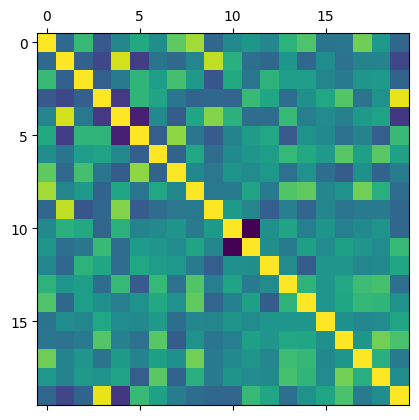

In [10]:
import matplotlib.pyplot as plt

plt.matshow(z_score_df.corr())
plt.show()

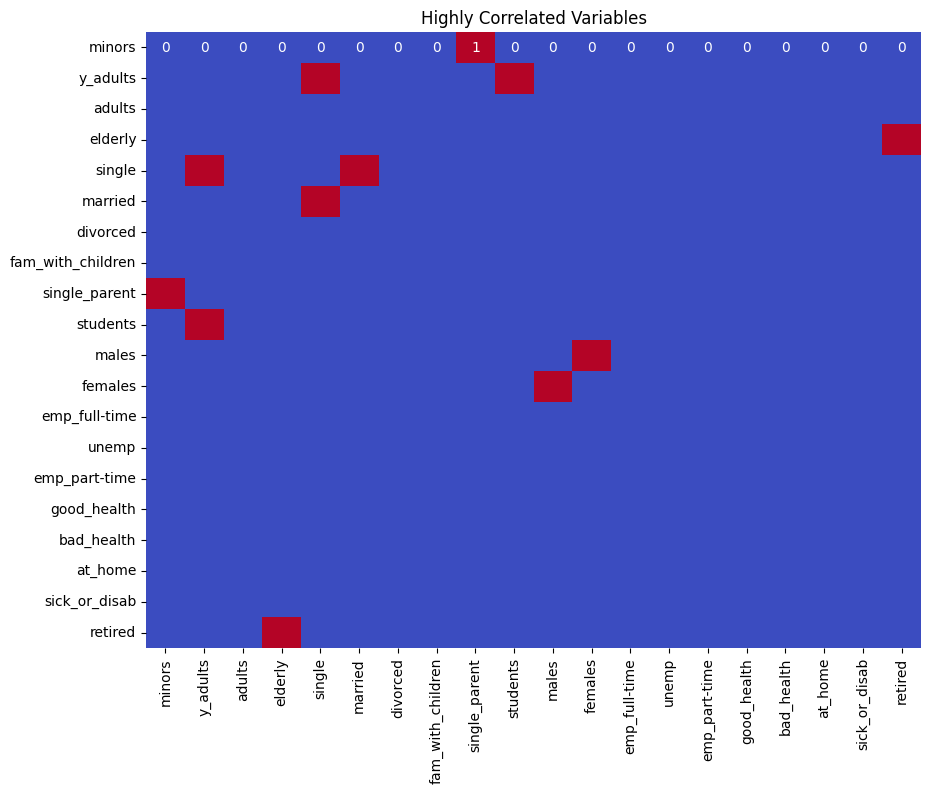

In [13]:
# plot graph to more easily identify highly correlated variable pairs

threshold = 0.7

highly_correlated = (corr.abs() > threshold) & (corr.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated, cmap='coolwarm', cbar=False, annot=True)

plt.title('Highly Correlated Variables')
plt.show()

In [11]:
# drop highly correlated variables

z_score_df.drop(['retired', 'y_adults', 'minors', 'married'], axis=1, inplace=True)

In [12]:
# new correlation check

corr_2 = z_score_df.corr()
corr_2.style.background_gradient(cmap='coolwarm')

,adults,elderly,single,divorced,fam_with_children,single_parent,students,males,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab
adults,1.000000,-0.387522,-0.190944,0.109954,0.410679,0.077601,-0.467311,0.218393,-0.218393,0.294637,0.121214,0.114166,-0.080007,-0.185211,0.046867,0.075419
elderly,-0.387522,1.000000,-0.670242,0.164343,-0.213002,-0.351594,-0.325777,-0.349863,0.349863,0.187342,-0.279055,0.003874,0.197523,0.463916,-0.234313,0.020717
single,-0.190944,-0.670242,1.000000,-0.039347,-0.409694,0.185729,0.626155,0.287012,-0.287012,-0.283824,0.336294,-0.145278,-0.037446,-0.131495,0.091769,0.151114
divorced,0.109954,0.164343,-0.039347,1.000000,-0.365959,0.191821,-0.284828,-0.040148,0.040148,0.120736,0.342516,0.215825,0.084291,0.482774,0.137425,0.489633
fam_with_children,0.410679,-0.213002,-0.409694,-0.365959,1.000000,-0.063040,-0.206678,0.038177,-0.038177,0.066148,-0.255357,0.014851,-0.277511,-0.409362,0.006529,-0.351665
single_parent,0.077601,-0.351594,0.185729,0.191821,-0.063040,1.000000,-0.187632,-0.166667,0.166667,-0.169875,0.455280,0.511891,-0.075892,0.016679,0.572191,0.255277
students,-0.467311,-0.325777,0.626155,-0.284828,-0.206678,-0.187632,1.000000,0.090423,-0.090423,-0.400406,-0.144048,-0.343872,-0.091539,-0.212575,-0.185022,-0.183419
males,0.218393,-0.349863,0.287012,-0.040148,0.038177,-0.166667,0.090423,1.000000,-1.000000,0.002343,0.169917,-0.133608,0.032883,-0.134045,-0.043751,0.032832
females,-0.218393,0.349863,-0.287012,0.040148,-0.038177,0.166667,-0.090423,-1.000000,1.000000,-0.002343,-0.169917,0.133608,-0.032883,0.134045,0.043751,-0.032832
emp_full-time,0.294637,0.187342,-0.283824,0.120736,0.066148,-0.169875,-0.400406,0.002343,-0.002343,1.000000,-0.038759,-0.410871,0.045148,0.039567,-0.070893,-0.049251


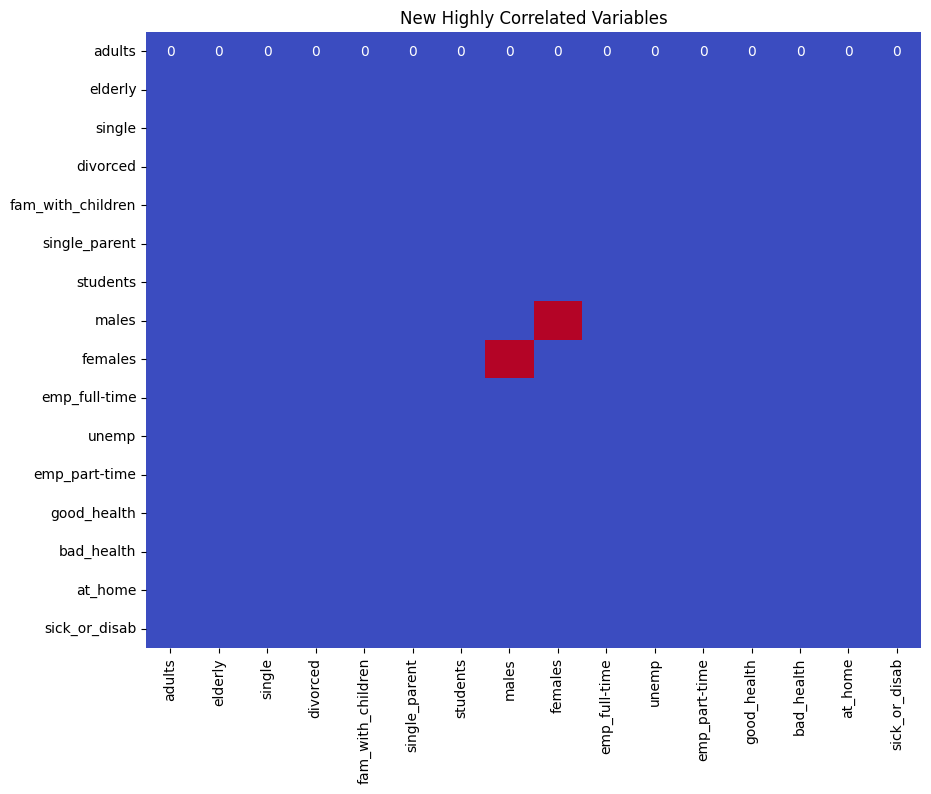

In [16]:
threshold = 0.7
highly_correlated_2 = (corr_2.abs() > threshold) & (corr_2.abs() < 1.0)

plt.figure(figsize=(10, 8))
sns.heatmap(highly_correlated_2, cmap='coolwarm', cbar=False, annot=True)

plt.title('New Highly Correlated Variables')
plt.show()

In [17]:
contains_nan = z_score_df.isna().any().any()

if contains_nan:
    print("DataFrame contains NaN values.")
else:
    print("DataFrame does not contain NaN values.")

Oh no :( the DataFrame contains NaN values.


In [13]:
# impute missing values using mean

z_score_df.fillna(z_score_df.mean(), inplace=True)

## K-means clustering

In [14]:
from sklearn.cluster import KMeans
from scipy.spatial.distance import cdist, pdist

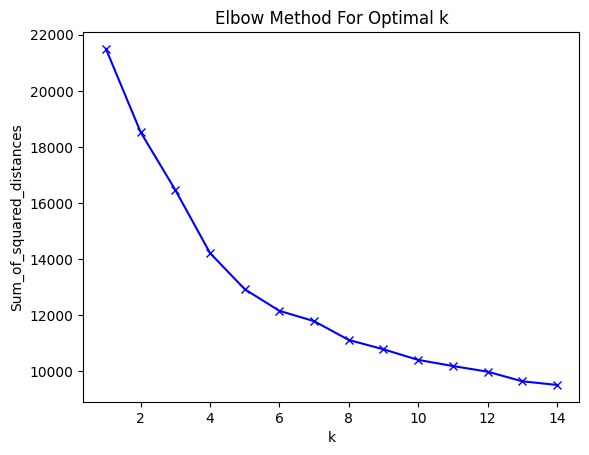

In [15]:
# find optimal number of clusters

Sum_of_squared_distances = []

K_range = range(1,15)

for k in K_range:
 km = KMeans(n_clusters=k)
 km = km.fit(z_score_df)
 Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(K_range, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

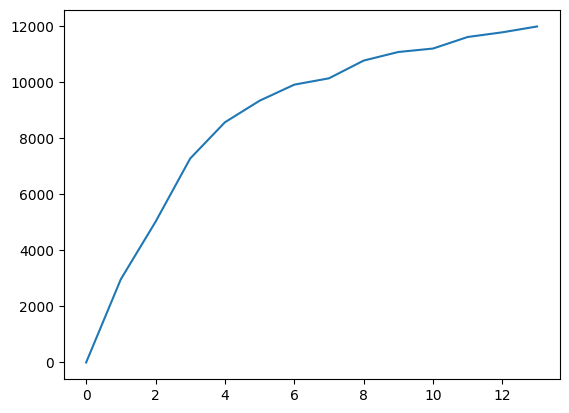

In [16]:
import numpy as np
def elbow(dataframe, n):
    kMeansVar = [KMeans(n_clusters=k).fit(dataframe.values) for k in range(1, n)] #making use of list comprehensions.
    centroids = [X.cluster_centers_ for X in kMeansVar]
    k_euclid = [cdist(dataframe.values, cent) for cent in centroids]
    dist = [np.min(ke, axis=1) for ke in k_euclid]
    wcss = [sum(d**2) for d in dist]
    tss = sum(pdist(dataframe.values)**2)/dataframe.values.shape[0]
    bss = tss - wcss
    plt.plot(bss)
    plt.show()
 
elbow(z_score_df,15)

In [17]:
# KMeans with 6 clusters, after the validation with the Elbow method.
kmeans = KMeans(n_clusters=6)
kmeans.fit(z_score_df)
labels = kmeans.predict(z_score_df)
cluster_centres = kmeans.cluster_centers_

z_score_df['Cluster'] = kmeans.labels_

In [18]:
z_score_df.head()

,adults,elderly,single,divorced,fam_with_children,single_parent,students,males,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab,Cluster
0,-0.574091,-1.326503,2.124519,-1.040626,-0.889656,-0.883783,1.513136,1.438049,-1.438049,-1.214245,-0.338907,-0.555548,0.695033,-0.843743,-0.478198,-0.520501,2
1,-0.244033,-0.663451,0.604768,-0.223321,-0.387687,-0.351030,1.264302,0.561098,-0.561098,-1.803806,0.025838,0.058968,1.735736,-1.059249,-0.709255,-0.421431,5
2,1.413050,-1.126500,0.075799,0.486726,0.877086,-0.038094,-0.353119,0.116879,-0.116879,1.251192,-0.535867,-0.711508,-1.563096,-1.117893,-0.216340,-0.680047,3
3,2.210573,-0.458506,0.282285,0.345831,-0.784946,-0.772651,-0.353119,0.769543,-0.769543,1.626367,-0.779145,-1.085303,-0.278744,-0.728560,-0.790175,-0.071191,5
4,-0.345355,0.930360,-0.862120,-0.540498,0.343631,-0.321178,-0.142517,-0.342521,0.342521,1.140484,-0.269378,-0.144250,0.503909,-0.728560,-1.030481,-1.127300,0


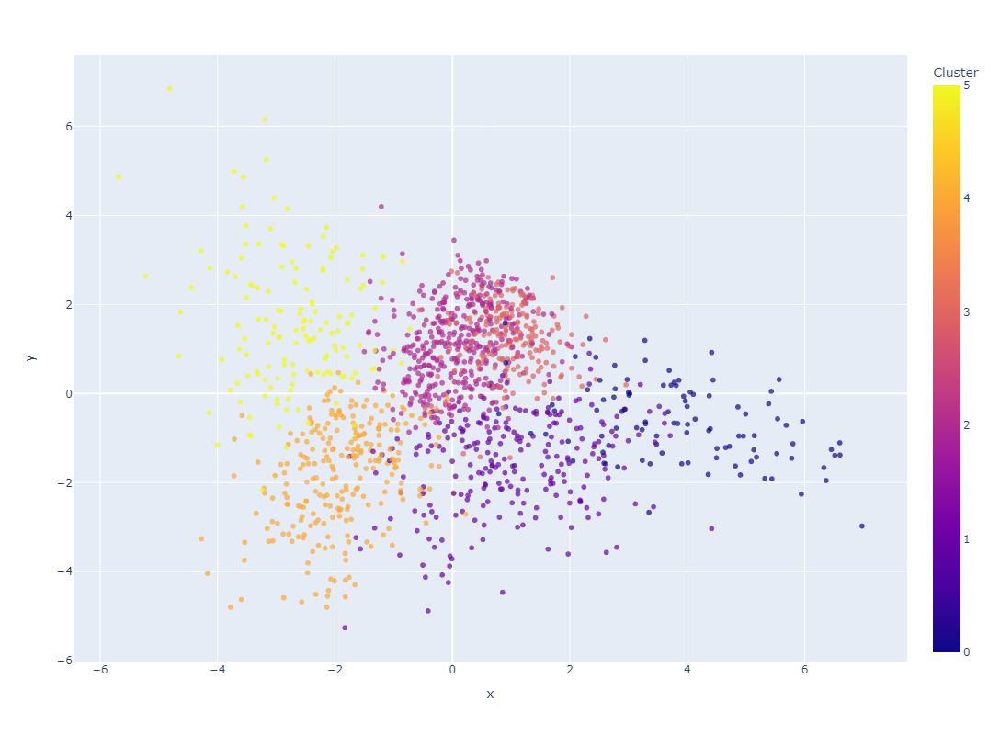

These two components explain 40.08% of the point variability.


<Figure size 1200x800 with 0 Axes>

In [19]:
# analyse principal components

import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

plt.figure(figsize=(12, 8))

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA analysys.
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

# Create a scatter plot
fig = px.scatter(x=pca_result[:, 0], y=pca_result[:, 1], color=clusters,
                 labels={'color': 'Cluster'},
                 #title='Cluster Plot against 1st 2 Principal Components',
                 opacity=0.7,
                 width=800, 
                 height=800)

plt.tight_layout()
fig.show()

print(f"These two components explain {(variance_ratio.sum()*100):.2f}% of the point variability.")

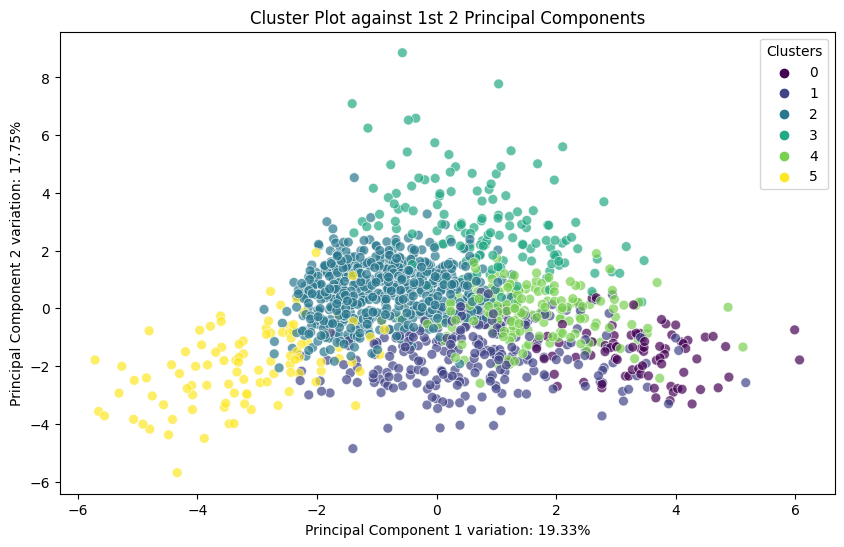

In [20]:
# Here is a static figure with the point variability included in the x/y-axis label.
# So we can see what variability is provided by each component.

kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

z_score_df['Cluster'] = clusters

import seaborn as sns

# Standardize the data for PCA
scaler = StandardScaler()
stand_data_scaled = scaler.fit_transform(z_score_df)

# PCA
pca = PCA(n_components=2).fit(stand_data_scaled)
pca_result = pca.transform(stand_data_scaled)

#Percentage of variance explained by each of the selected components.
variance_ratio = pca.explained_variance_ratio_

plt.figure(figsize=(10, 6))
sns.scatterplot(x=pca_result[:, 0], y=pca_result[:, 1], hue=clusters, palette='viridis', s=50, alpha=0.7)
plt.title('Cluster Plot against 1st 2 Principal Components')
plt.xlabel(f'Principal Component 1 variation: {variance_ratio[0]*100:.2f}%')
plt.ylabel(f'Principal Component 2 variation: {variance_ratio[1]*100:.2f}%')
plt.legend(title='Clusters')
plt.show()


## Interpretation of cluster centres

In [21]:
# KMeans clustering
kmeans = KMeans(n_clusters=6)
clusters = kmeans.fit_predict(z_score_df)

# Get the cluster centers
cluster_centers = kmeans.cluster_centers_


# Get the cluster centers
cluster_centers = pd.DataFrame(kmeans.cluster_centers_, columns=z_score_df.columns)

cluster_centers.head()

,adults,elderly,single,divorced,fam_with_children,single_parent,students,males,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab,Cluster
0,-1.089435,1.790907,-0.740389,0.920229,-0.783793,-0.547175,-0.265994,-0.876008,0.876008,0.298609,-0.378752,-0.104111,0.091749,1.664370,-0.427879,0.675276,3.000000
1,0.316587,-0.535639,0.761345,0.472869,-0.535638,-0.007108,-0.056470,0.982887,-0.982887,0.224698,0.765925,-0.134922,0.199155,0.161982,0.146822,0.508663,0.896797
2,0.892660,-0.386196,-0.711905,-0.708123,1.725515,-0.423162,-0.273520,0.274770,-0.274770,0.223995,-0.634804,-0.289966,-0.718429,-0.734508,-0.270230,-0.748604,1.990196
3,-1.553192,-1.051947,2.033430,-1.047406,-0.625828,-0.556679,2.892610,0.198028,-0.198028,-1.241560,-0.541969,-1.151097,-0.300135,-0.756500,-0.561392,-0.720867,5.000000
4,0.097236,-0.513780,0.282925,0.392766,-0.150828,1.500844,-0.303899,-0.546007,0.546007,-0.488374,0.858943,1.108709,-0.193137,0.170401,1.071987,0.622640,3.134199


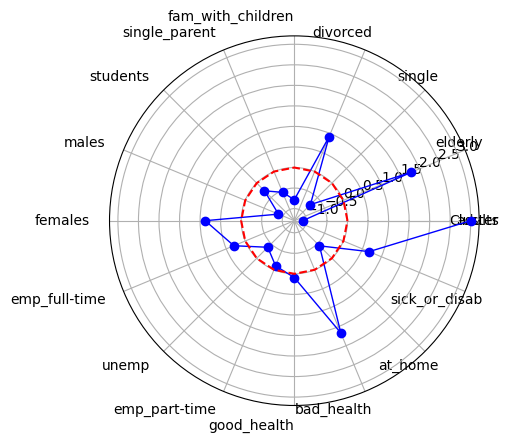

In [22]:
# cluster 0

first_row_centers = cluster_centers.iloc[0, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

### Elderly Citizens
This group consists of retired, elderly citizens, small part of whom may still be in full-time employment. This group suffers from poorer health outcomes and many are economically inactive due to long-term sickness or disability. There is a lot of women in this group and being divorced is also one of the typical characteristics.


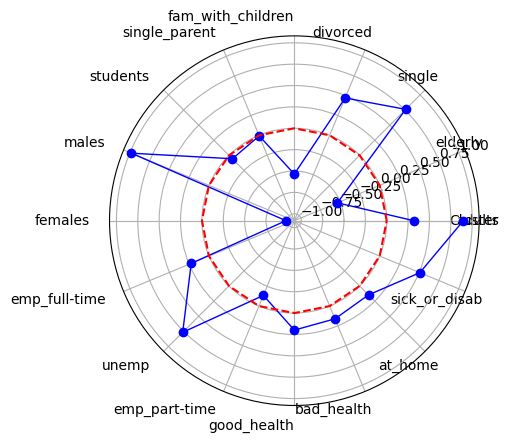

In [23]:
# cluster 1

first_row_centers = cluster_centers.iloc[1, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

### Long-Term Sick or Disabled
This group differs from the previous one in that it comprises of mostly adults, rather than elderly, and contains a high proportion of males. The people in this group tend to be economically inactive and have poor health outcomes. They are either single or divorced.



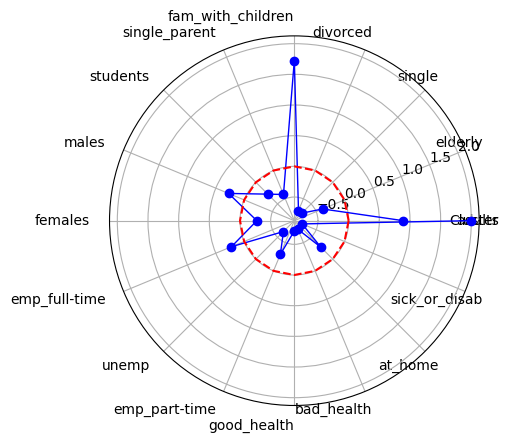

In [24]:
# cluster 2

first_row_centers = cluster_centers.iloc[2, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

### Families with Children
These neighbourhoods consist of families with dependent children, with the adults tending to be in full-time employment.



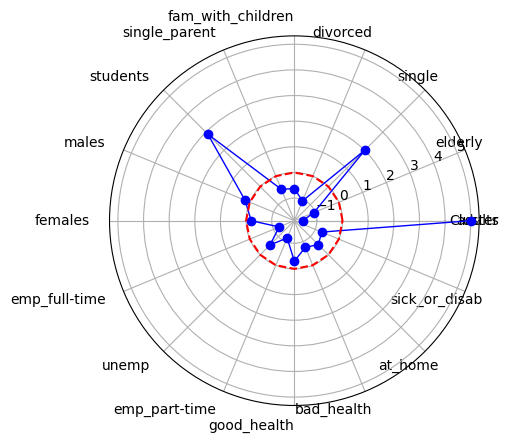

In [25]:
# cluster 3

first_row_centers = cluster_centers.iloc[3, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

### Students
The people in this group are in full-time higher education and are single with no dependents.


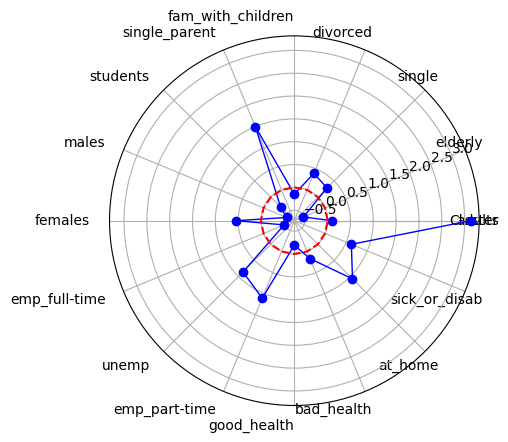

In [26]:
# cluster 4

first_row_centers = cluster_centers.iloc[4, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

### Single Parents

This group contains a high proportion of single parents with dependent children, especially women, who have either never been married or have divorced. These single parents tend to be either unemployed or work only part-time, or stay at home to look after their family. There is a tendency towards poorer health outcomes for this group.


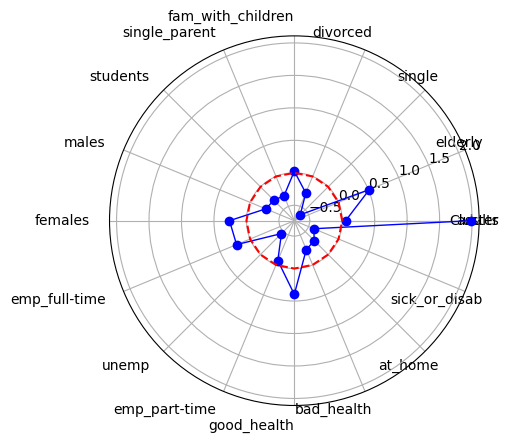

In [27]:
# cluster 5

first_row_centers = cluster_centers.iloc[5, :]

# len of features
num_features = len(first_row_centers)

# polar coordinates
theta = np.linspace(0, 2 * np.pi, num_features, endpoint=True)

fig, ax = plt.subplots(subplot_kw={'projection': 'polar'})
ax.plot(theta, first_row_centers, linewidth=1, color='blue', marker='o', label='Centers')
# Add an extra red line at the 0.0 value
ax.plot(theta, np.zeros_like(first_row_centers), color='red', linestyle='--', label='Avarage')

ax.set_xticks(theta)
ax.set_xticklabels(cluster_centers.columns, rotation=45, ha='right')

plt.show()
#Ignore the cluster polar values, and focus in he census variables.

### Established Professionals

The group represented in the above diagram is a neighbourhood consisting oadult and elderlyer people who are well established in their full-time careers and enjoy good healt.


##  Mapping the clusters

In [36]:
list(z_score_df.columns)

['adults',
 'elderly',
 'single',
 'divorced',
 'fam_with_children',
 'single_parent',
 'students',
 'males',
 'females',
 'emp_full-time',
 'unemp',
 'emp_part-time',
 'good_health',
 'bad_health',
 'at_home',
 'sick_or_disab',
 'Cluster']

In [28]:
# keep only the cluster assignment from the dataframe

z_score_df.drop([
 'adults',
 'elderly',
 'single',
 'divorced',
 'fam_with_children',
 'single_parent',
 'students',
 'males',
 'females',
 'emp_full-time',
 'unemp',
 'emp_part-time',
 'good_health',
 'bad_health',
 'at_home',
 'sick_or_disab'], axis=1, inplace=True)
z_score_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1344 entries, 0 to 1343
Data columns (total 1 columns):
 #   Column   Non-Null Count  Dtype
---  ------   --------------  -----
 0   Cluster  1344 non-null   int32
dtypes: int32(1)
memory usage: 5.4 KB


In [29]:
# Concatenate the resulting tables.
final_df = pd.concat([dundee_census_data, z_score_df], axis=1, ignore_index=False)
final_df.head()

,code,Popcount,HHcount,DataZone,geometry,minors,y_adults,adults,elderly,single,...,females,emp_full-time,unemp,emp_part-time,good_health,bad_health,at_home,sick_or_disab,retired,Cluster
0,S00099543,117,65,S01007711,"POLYGON ((340487.292 730518.631, 340482.034 73...",1.709402,64.957265,31.623932,1.709402,80.869565,...,43.589744,47.619048,4.385965,17.460317,35.042735,1.709402,1.754386,3.508772,1.754386,5
1,S00099548,115,50,S01007713,"POLYGON ((340646.802 731081.561, 340649.389 73...",13.913043,38.260870,34.782609,13.043478,52.941176,...,48.695652,41.071429,6.122449,23.214286,41.739130,0.869565,1.020408,4.081633,8.163265,1
2,S00099111,156,58,S01007802,"POLYGON ((342264.449 732286.711, 342256.623 73...",26.282051,17.948718,50.641026,5.128205,43.220339,...,51.282051,75.000000,3.448276,16.000000,20.512821,0.641026,2.586207,2.586207,0.862069,2
3,S00099269,139,81,S01007780,"POLYGON ((344784.000 733788.000, 344794.683 73...",6.474820,18.705036,58.273381,16.546763,47.014925,...,47.482014,79.166667,2.290076,12.500000,28.776978,2.158273,0.763359,6.106870,12.213740,1
4,S00099374,139,64,S01007766,"POLYGON ((346960.001 731725.000, 346797.000 73...",14.388489,11.510791,33.812950,40.287770,25.984252,...,53.956835,73.770492,4.716981,21.311475,33.812950,2.158273,0.000000,0.000000,27.358491,2


In [39]:
final_df.columns

Index(['code', 'Popcount', 'HHcount', 'DataZone', 'geometry', 'minors',
       'y_adults', 'adults', 'elderly', 'single', 'married', 'divorced',
       'fam_with_children', 'single_parent', 'students', 'males', 'females',
       'emp_full-time', 'unemp', 'emp_part-time', 'good_health', 'bad_health',
       'at_home', 'sick_or_disab', 'retired', 'Cluster'],
      dtype='object')

In [30]:
# rename clusters

final_df['Cluster'] = final_df['Cluster'].astype(str)

def rename_column(x): 
    x = x.replace("0", "Elderly Citizens")
    x = x.replace("1", "Long-Term Sick or Disabled")
    x = x.replace("2", "Families with Children")
    x = x.replace("3", "Students")
    x = x.replace("4", "Single Parents")
    x = x.replace("5", "Established Professionals")
    return x

final_df['Cluster'] = final_df['Cluster'].apply(rename_column)

In [31]:
# final map

final_df.explore(column='Cluster', cmap='Set1', tiles='CartoDB positron')

## Limitations and potential applications
This geodemographic classification utilised statistical data from the 2011 Scottish Census, however, the groups obtained and their classification was influenced by subjectity in the form of choice of variables for analysis and choice of cluster numbers. Other limitations include lack of consideration of more detailed economic data, for example income levels, ethnicity, or religion, as these factors influence the lived experiences of families across different neighbourhoods and their access to services.  
The results could potentially be used to allocate financial resources to relevant support initiatives based on specific needs of different neighbourhoods. For example, neighbourhoods with Elderly Citizens or Long-Term Sick or Disabled groups should ensure easy access to healthcare and improve accessibility of buildings. In neighbourhoods with Families with Children and Single Parents, emphasis should be on providing adequate childcare facilities and part-time employment opportunities for single parents.